In [1]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import Dataset,DataLoader
import torchvision.transforms as transforms
from  torchvision.datasets import ImageFolder
from torch.autograd import Variable
import cv2
import numpy as np
import os, random,sys


# Build a Variational Autoencoder (VAE) for a human face dataset

We will use a dataset containing images of people and train a variational autoencoder on it. 

## Step 1

Download and unzip the ``lfw.zip`` file . Adjust the ``path`` variable so that it contains the address of the unzipped folder. We will create a dataloader from this folder.


In [2]:
path = '/Users/visheshmehta/College/Semester2/Pr/Hw3/lfw'

In [3]:
transform    = transforms.Compose([transforms.ToTensor()]) 
dataloader = DataLoader(ImageFolder(path, transform,),batch_size=32, shuffle=False)


This project is compute intensive. If you have a cuda or mps device on your laptop make sure you use that in the training.

In [4]:
if torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    print ("MPS device not found.")


torch.Size([250, 250, 3])


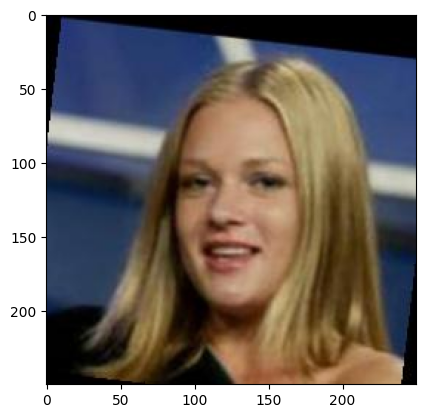

In [5]:
for x,y in dataloader:
    x = x[0].permute(1, 2, 0)
    print(x.shape)
    plt.imshow(x)
    break

# Step 2
The basis for this project is that you can alter your implementation of AutoEncoders from the previous homework and add the necessary bits for a VAE.  Clearly state what is the difference between AutoEncoders and VAEs in terms of Applications, Architecture and Loss function. 

* The main difference between AE and VAE is that, AE creates a deterministic latent space z, whle VAE tries to mimick gausssian/normal like distribution and then the latent space is sampled from that distribution.
* Hence, in the architecture we need to change the forward pass.
* To generate distribution, We first get the reduced vector from encoder and compute mean and logvariance of this space.
* Now, to sample z from this distribution we compute the stadard deviation from logvariance. 
* std_f = torch.exp(0.5 * logvar_f)
* z = torch.randn_like(mu_f) * std_f + mu_f
* In order to sample z from normal distribution we generate simple normal distribution and then shift it to our mean and std of the distribution.

# Step 3

Update your pytorch autoencoder model class to create your VAE. Assume the encoder produces the mean and log variance of the latent space.  

**Create separate functions for the encoder and decoder.**

In [6]:
class VAE(nn.Module):
    
    def __init__(self):
        super(VAE,self).__init__()  
        self.encoded_images = self.encoder()
        self.decoded_images = self.decoder()
        
    def encoder(self):

            return nn.Sequential(nn.Conv2d(3, 8, kernel_size=3, stride=1, padding=1), # b, 64, 250, 250
                                 nn.BatchNorm2d(8),  # b, 64, 250, 250
                                 nn.ReLU(True),  # b, 64, 250, 250
                                 nn.MaxPool2d(2, stride=2),  # b, 64, 125, 125
                                 
                                 nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),  # b, 128, 125, 125
                                 nn.BatchNorm2d(16),  # b, 128, 125, 125
                                 nn.ReLU(True),  # b, 128, 125, 125
                                 nn.MaxPool2d(2, stride=2),  # b, 128, 62,
                                 
                                 nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=2),  # b, 128, 64, 64
                                 nn.BatchNorm2d(32),  # b, 128, 64, 64
                                 nn.ReLU(True),  # b, 128, 64, 64
                                 nn.MaxPool2d(2, stride=2) # b, 128, 32, 32 
                                ) 
            

    # Hout =(Hin −1)×stride[0]−2×padding[0]+dilation[0]×(kernel_size[0]−1)+output_padding[0]+1
    def decoder(self):
        return nn.Sequential(nn.ConvTranspose2d(16, 16, kernel_size=3, stride=2, padding=1),
                             nn.BatchNorm2d(16),
                             
                             nn.ConvTranspose2d(16, 8, kernel_size=3, stride=2, padding=1),
                             nn.BatchNorm2d(8),
                             
                             nn.ConvTranspose2d(8, 3, kernel_size=3, stride=2, padding=1, output_padding=1),
                             nn.Tanh()
                            )
        
    def forward(self,x):
        encoded_images = self.encoded_images(x)
        mu_f, logvar_f = encoded_images.split(encoded_images.size(1)//2, 1)
        std_f = torch.exp(0.5 * logvar_f)
        encoded_images = torch.randn_like(mu_f) * std_f + mu_f
        decoded_images = self.decoded_images(encoded_images)
        return decoded_images
       

## Step 4
Create an instance of the new class, pass an image to the model

*  print the shape of the output of the **encoder**. Explain how would you generate new samples in the latent space. Your explanation should show that you have understood the concepts. Providing just the formula or code snippet without context will not earn any points.
*  use the decoder to create new images. Print the shape of the output and verify that the forward pass is working correctly. 

* Vae outputs mean and logvariance and not the fixed latent embedding z.
* Now, everytime for each data z is sampled from the generated distribution.
* Also while generating the distribution we reparametrize the standard deviation and then sample the z from distribution with mean and s.d.
* By this, eveytime new samples anre generated as the laent space is not deterministic but a sample from distribution of input images.

In [7]:
model = VAE()

In [8]:
for x,y in dataloader:
        # ===================forward=====================
    output_encoder = model.encoded_images(x)
    print(output_encoder.shape)
    mu_f, logvar_f = output_encoder.split(output_encoder.size(1)//2, 1)
    std_f = torch.exp(0.5 * logvar_f)
    output_encoder = torch.randn_like(mu_f) * std_f + mu_f
    output_decoder = model.decoded_images(output_encoder)
    
    print(output_decoder.shape)
    output_vae = model.forward(x)
    print(output_vae.shape)
    break

torch.Size([32, 32, 32, 32])
torch.Size([32, 3, 250, 250])
torch.Size([32, 3, 250, 250])


##  Step 5
* Print the total number of parameters in the model
* Explain what loss should be used here. Describe in your own words the terms of the loss function and what goal each term of the loss function achieves. Your explanation should show that you have understood the concepts. Providing just the formula or code snippet without context will not earn any points.


* The loss function has two parts, KL loss and reconstrution loss.
* The KL divergence is measure of how the two probability distribution are different from each other.
* So, the kl divergence loss tries to reduce the distance two distribution (our latent space z) and random normal distibution.
* The second part is reconstruction loss which is simple the distance between the generated image and original image.
* the loss function tries to reduce bothe the above loss.

In [9]:
total_parameters = sum(params.numel() for params in model.parameters())
print(total_parameters)

9891


* create an optimizer for training

In [10]:
optim = torch.optim.Adam(model.parameters(), lr=0.001,
                             weight_decay=1e-5)

In [11]:
loss_function = nn.MSELoss()

##  Step 6
Write a training loop and start training the model for several epochs. Report the loss value at the end of each epoch and monitor it. If your loss is not decreasing what do you have to do to troubleshoot it ?

In [12]:
mu_f, logvar_f = output_encoder.split(output_encoder.size(1)//2,1)
print(mu_f.shape)

torch.Size([32, 8, 32, 32])


In [13]:
for epoch in range(32):
    total_loss = 0
    i=0
    for img,y in dataloader:
        # ===================forward=====================

        param_f = model.encoded_images(img)
        # mu_f, logvar_f = param_f.split(param_f.size(1)//2, 1)
        mu_f, logvar_f = param_f.split(param_f.size(1)//2, 1)
        std_f = torch.exp(0.5 * logvar_f)
        z = torch.randn_like(mu_f) * std_f + mu_f 
        #print(z.shape)
        
        kl = - 0.5 * (1 + logvar_f - mu_f.pow(2) - logvar_f.exp()) 
        kl_loss = kl.sum() / img.size(0)
        
        output = model.decoded_images(z)
        #fit = 0.5 * (output - img).pow(2) 
        #fit_loss = fit.sum() / img.size(0)
        loss = loss_function(output,img)
        loss += kl_loss
        
        
        # ===================backward====================
        
        optim.zero_grad()
        loss.backward()
        optim.step()
        total_loss += loss.data
        print("epoch ", epoch," batch ",i," loss ",loss)
        i = i+1
    # ===================log========================
    print('epoch [{}/{}], loss:{:.4f}'
          .format(epoch+1, 32, total_loss))

epoch  0  batch  0  loss  tensor(386454., grad_fn=<AddBackward0>)
epoch  0  batch  1  loss  tensor(24349.5605, grad_fn=<AddBackward0>)
epoch  0  batch  2  loss  tensor(16981.1680, grad_fn=<AddBackward0>)
epoch  0  batch  3  loss  tensor(15424.3789, grad_fn=<AddBackward0>)
epoch  0  batch  4  loss  tensor(13084.8574, grad_fn=<AddBackward0>)
epoch  0  batch  5  loss  tensor(12565.1416, grad_fn=<AddBackward0>)
epoch  0  batch  6  loss  tensor(11069.3135, grad_fn=<AddBackward0>)
epoch  0  batch  7  loss  tensor(10996.2568, grad_fn=<AddBackward0>)
epoch  0  batch  8  loss  tensor(10663.6836, grad_fn=<AddBackward0>)
epoch  0  batch  9  loss  tensor(10190.6230, grad_fn=<AddBackward0>)
epoch  0  batch  10  loss  tensor(9765.5488, grad_fn=<AddBackward0>)
epoch  0  batch  11  loss  tensor(9281.5752, grad_fn=<AddBackward0>)
epoch  0  batch  12  loss  tensor(8713.0410, grad_fn=<AddBackward0>)
epoch  0  batch  13  loss  tensor(8927.7637, grad_fn=<AddBackward0>)
epoch  0  batch  14  loss  tensor(882

In [14]:
torch.save(model.state_dict(), './generated/conv_autoencoder1.pth')

In [8]:
model_reloaded = VAE()

In [9]:
filepath = './generated/conv_autoencoder1.pth'
model_reloaded.load_state_dict(torch.load(filepath))

<All keys matched successfully>

In [10]:
for param in model_reloaded.parameters():
  print(param.data)

tensor([[[[-8.9511e-02,  8.2777e-02,  1.8108e-01],
          [ 4.4762e-02,  3.6049e-02, -3.7920e-02],
          [-1.2272e-01,  2.2057e-02,  3.4196e-02]],

         [[ 5.7508e-02, -1.2780e-02, -1.2547e-01],
          [ 1.5689e-01, -4.3088e-02, -1.5043e-01],
          [-1.8827e-01, -4.0961e-02,  1.0807e-01]],

         [[ 3.3924e-02,  6.8180e-02,  7.6052e-02],
          [-8.1282e-02, -1.2128e-01,  5.4268e-02],
          [-1.7732e-01, -1.5898e-01,  1.7721e-01]]],


        [[[ 7.3106e-02,  1.0348e-01,  5.0076e-02],
          [ 9.9506e-03,  3.6245e-02,  1.5204e-01],
          [-4.1558e-01,  1.6562e-01,  1.5571e-01]],

         [[ 6.2746e-02,  8.1242e-02,  1.5686e-01],
          [-9.3266e-02, -1.4393e-01, -4.2242e-02],
          [-1.5660e-01, -7.9400e-02, -6.3443e-02]],

         [[-1.8243e-01, -3.8246e-02,  2.8209e-02],
          [-6.3369e-02,  1.4661e-01,  1.2784e-01],
          [ 9.4643e-02, -3.0429e-02,  1.3090e-01]]],


        [[[ 7.0585e-03, -1.6961e-01,  1.2149e-01],
          [-9.2

##  Step 7

Take a random image from the dataset and plot it together with new samples generated.

In [15]:
plt.imshow()

TypeError: imshow() missing 1 required positional argument: 'X'

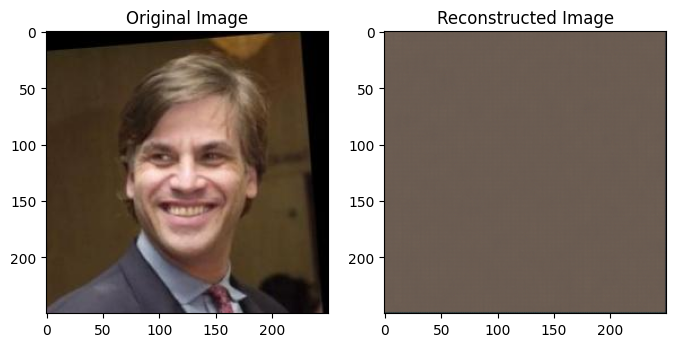

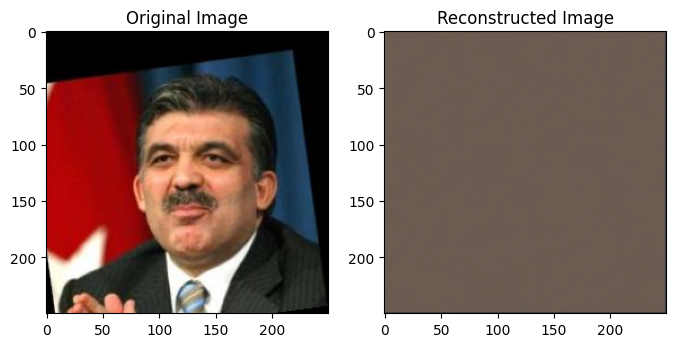

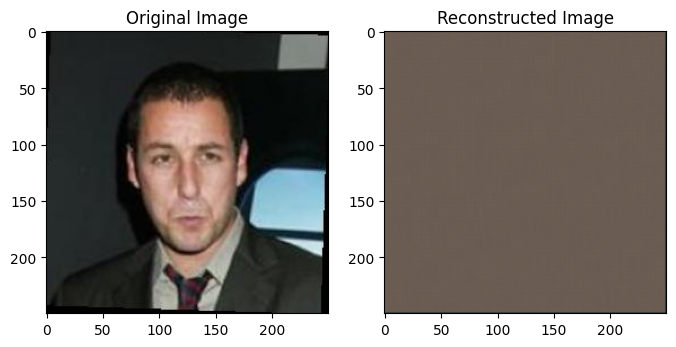

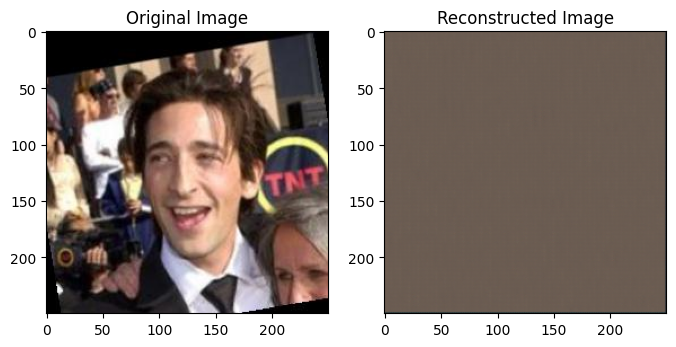

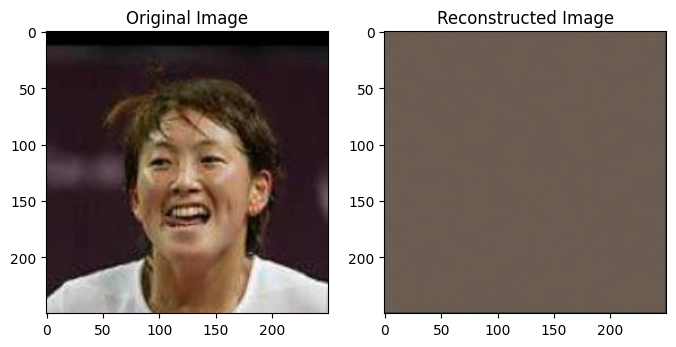

...

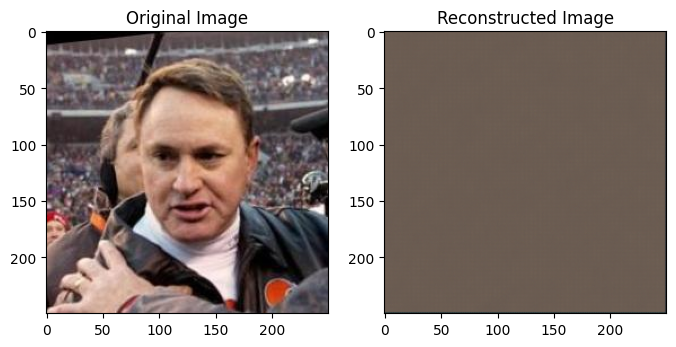

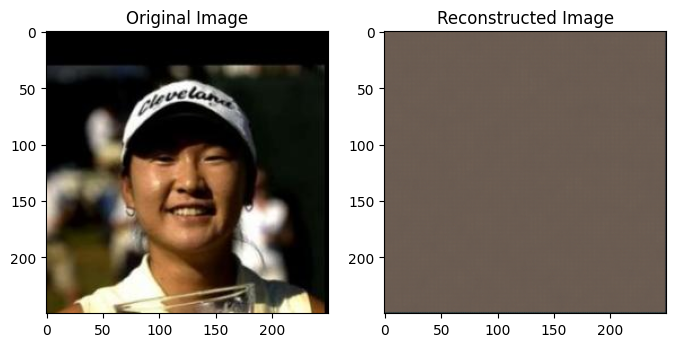

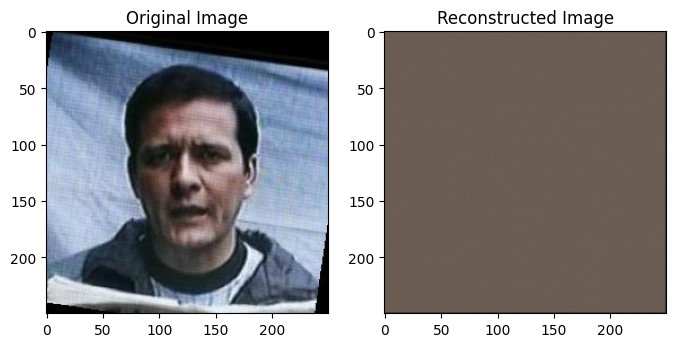

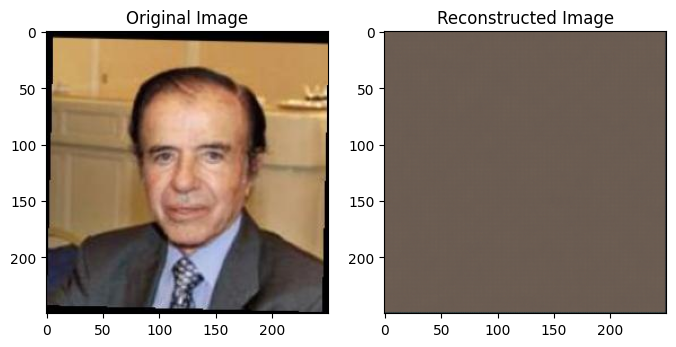

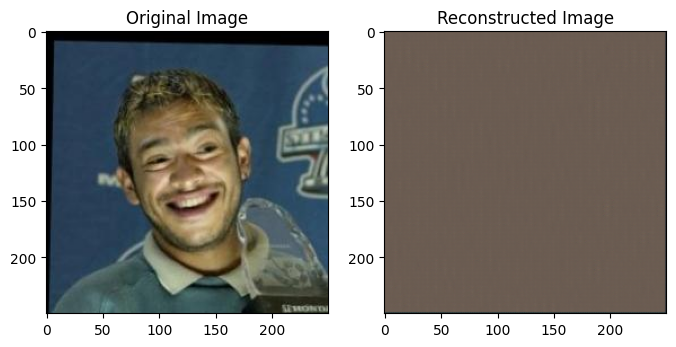

KeyboardInterrupt: 

In [11]:
for images, _ in dataloader:
    original_image = images[12]

    # Forward pass through the model
    with torch.no_grad():
        #encoding=model.encoded_images(original_image.unsqueeze(0))
        #decoding=model.decoded_images(encoding)
        #reconstructed_image = model_reloaded.forward(original_image.unsqueeze(0))  # Add an extra dimension for batch size
        output_encoder = model_reloaded.encoded_images(original_image.unsqueeze(0))
        #print(output_encoder)
        mu_f, logvar_f = output_encoder.split(output_encoder.size(1)//2, 1)
        std_f = torch.exp(0.5 * logvar_f)
        output_encoder = torch.randn_like(mu_f) * std_f + mu_f
        reconstructed_image = model_reloaded.decoded_images(output_encoder) 

    # Convert tensors to numpy arrays for visualization
    original_image_np = original_image.permute(1, 2, 0).cpu().numpy()
    reconstructed_image_np = reconstructed_image.squeeze(0).permute(1, 2, 0).cpu().numpy()

    # Plot the original and reconstructed images side by side
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(original_image_np)
    axes[0].set_title('Original Image')

    axes[1].imshow(reconstructed_image_np)
    axes[1].set_title('Reconstructed Image')

    plt.show()
    break